# DCGAN
Run in kaggle :) or edit slightly to run locally

In [ ]:
!pip install tqdm

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
from pathlib import Path
import time
from tqdm.auto import tqdm # auto to not print every update
import math
import wandb
import random
import itertools
from kaggle_secrets import UserSecretsClient

print("GPU Available:", torch.cuda.is_available())
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

secret_label = "wandb"
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret(secret_label)
# Set the API key as an environment variable
os.environ['WANDB_API_KEY'] = secret_value_0

GPU Available: True


In [10]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, repeats=1):
        self.img_dir = img_dir
        self.transform = transform
        images = [Image.open(path).convert("RGB") for path in list(Path(img_dir).iterdir())]
        self.images = []
        for img in images:
            self.images.extend(itertools.repeat(img, repeats))
        print(f"Total images with {repeats} duplicates: {len(self.images)}")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        if self.transform:
            image = self.transform(image)
        return image, 0  # Return a placeholder label since we don't have class labels

class DataManager:
    def __init__(self, data_dir, batch_size, image_size, z_dim, repeats):
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.image_size = image_size
        self.z_dim = z_dim
        self.repeats = repeats

        # NOTE: for data augmentation, 
        # handle via augmentation_transforms (gated by cfg.DISCRIM_AUG) per ADA
        self.transform = transforms.Compose([
            transforms.Resize((self.image_size, self.image_size)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

        self.dataset = CustomImageDataset(self.data_dir, transform=self.transform, repeats=self.repeats)
        self.dataloader = DataLoader(self.dataset, batch_size=self.batch_size, shuffle=True)

    def get_dataloader(self):
        return self.dataloader

def imshow(img, figsize=(15,15)):
    plt.figure(figsize=figsize)
    plt.imshow(img.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.show()

def preview_images(dataloader):
    dataiter = iter(dataloader)
    images, _labels = next(dataiter)
    imshow(vutils.make_grid(images))

def save_fake_images(epoch, generator, fixed_z, device, num_images=27, img_size=28):
    with torch.no_grad():
        fixed_size_subset = fixed_z[:num_images]
        fake_images = generator(fixed_size_subset.to(device)).cpu()
        fake_images = fake_images.view(fake_images.size(0), 3, img_size, img_size)
        if wandb.run:
            wandb.log({"Generated Images": [wandb.Image(img) for img in fake_images]})
        else:
            save_image(fake_images, f'fake_images_{epoch+1}.png')

In [11]:
# based on https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html
class Generator(nn.Module):
    def __init__(self, n_gen_feats, n_gpu, z_dim, n_channels):
        super(Generator, self).__init__()
        self.n_gpu = n_gpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(z_dim, n_gen_feats * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(n_gen_feats * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_gen_feats*8) x 4 x 4
            nn.ConvTranspose2d(n_gen_feats * 8, n_gen_feats * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_feats * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_gen_feats*4) x 8 x 8
            nn.ConvTranspose2d(n_gen_feats * 4, n_gen_feats * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_feats * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_gen_feats*2) x 16 x 16
            nn.ConvTranspose2d(n_gen_feats * 2,     n_gen_feats, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_feats),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_gen_feats) x 32 x 32
            nn.ConvTranspose2d(n_gen_feats, n_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (n_channels) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self, n_disc_feats, n_gpu, n_channels):
        super(Discriminator, self).__init__()
        self.n_gpu = n_gpu
        self.main = nn.Sequential(
            # input is (n_channels) x 64 x 64
            nn.Conv2d(n_channels, n_disc_feats, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_feats) x 32 x 32
            nn.Conv2d(n_disc_feats, n_disc_feats * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_feats * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_feats*2) x 16 x 16
            nn.Conv2d(n_disc_feats * 2, n_disc_feats * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_feats * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_feats*4) x 8 x 8
            nn.Conv2d(n_disc_feats * 4, n_disc_feats * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_feats * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_feats*8) x 4 x 4
            nn.Conv2d(n_disc_feats * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1, 1).squeeze(1)

# custom weights initialization called on generator and discriminator
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class ADAScheduler:
    """_summary_
        Adaptive Discriminator Augmentation (ADA) scheduler to adjust augmentation probability based on discriminator accuracy.
        Improves performance on small datasets, see paper: https://arxiv.org/abs/2006.06676
    """
    def __init__(self, target_accuracy=0.6, integration_steps=100, initial_probability=0.0):
        self.target_accuracy = target_accuracy
        self.integration_steps = integration_steps
        self.probability = initial_probability

    def adjust_probability(self, real_acc, fake_acc):
        current_accuracy = 0.5 * (real_acc + fake_acc)
        accuracy_error = current_accuracy - self.target_accuracy
        self.probability += accuracy_error / self.integration_steps
        self.probability = np.clip(self.probability, 0.0, 1.0)
        return self.probability

def apply_augmentations(images, p, augmentation_transforms):
    if random.random() < p:
        return augmentation_transforms(images)
    return images

def train_gan(data_manager, generator, discriminator, g_optimizer, d_optimizer, criterion, num_epochs, device, cfg):
    augmentation_transforms = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(degrees=15), # TODO: add rot value to config
        # TODO: experiment with these other transformations
        # transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        # transforms.RandomResizedCrop(size=64, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
    ])

    dataloader = data_manager.get_dataloader()
    fixed_z = torch.randn(cfg.BATCH_SIZE, cfg.Z_DIM, 1, 1, device=device)
    img_size = cfg.IMAGE_SIZE
    ada_scheduler = ADAScheduler(target_accuracy=0.6, integration_steps=cfg.ADA_INTEG_STEPS, initial_probability=0.01)
    step = 1
    for epoch in tqdm(range(num_epochs), desc="Epochs"):
        for i, (real_images, _) in enumerate(dataloader):
            batch_size = real_images.size(0)
            real_images = real_images.to(device)

            if cfg.DISCRIM_AUG:
                real_images = apply_augmentations(real_images, ada_scheduler.probability, augmentation_transforms)

            # Label smoothing to prevent overfitting
            real_labels = torch.full((batch_size,), 1 - cfg.SMOOTH, dtype=torch.float, device=device)
            fake_labels = torch.full((batch_size,), cfg.SMOOTH, dtype=torch.float, device=device)

            ### Train the Discriminator ###
            d_optimizer.zero_grad()

            outputs_real = discriminator(real_images)
            if outputs_real.shape != real_labels.shape:
                outputs_real = outputs_real.squeeze()
            d_loss_real = criterion(outputs_real, real_labels)

            # Calculate real accuracy for label smoothing
            real_predictions = (outputs_real > 0.5).float()
            real_targets = (real_labels > 0.5).float()
            real_accuracy = (real_predictions == real_targets).float().mean().item()
            z = torch.randn(batch_size, cfg.Z_DIM, 1, 1, device=device)
            fake_images = generator(z)
            if cfg.DISCRIM_AUG:
                fake_images = apply_augmentations(fake_images, ada_scheduler.probability, augmentation_transforms)
            outputs_fake = discriminator(fake_images.detach())
            d_loss_fake = criterion(outputs_fake, fake_labels)

            # Calculate fake accuracy for label smoothing
            fake_predictions = (outputs_fake > 0.5).float()
            fake_targets = (fake_labels > 0.5).float()
            fake_accuracy = (fake_predictions == fake_targets).float().mean().item()

            d_loss = d_loss_real + d_loss_fake
            d_loss.backward()
            d_optimizer.step()

            ### Train the Generator ###
            g_optimizer.zero_grad()

            z = torch.randn(batch_size, cfg.Z_DIM, 1, 1, device=device)
            fake_images = generator(z)
            outputs_fake = discriminator(fake_images)
            g_loss = criterion(outputs_fake, real_labels)

            g_loss.backward()
            g_optimizer.step()

            if cfg.DISCRIM_AUG:
                ada_scheduler.adjust_probability(real_accuracy, fake_accuracy)
            
            if epoch % cfg.LOG_FREQ == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], '
                      f'D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}, '
                      f'Real Accuracy: {real_accuracy:.4f}, Fake Accuracy: {fake_accuracy:.4f}')

            if epoch % cfg.SAVE_FREQ == 0:
                save_fake_images(epoch, generator, fixed_z, device, img_size=img_size)

            if wandb.run:
                stats = {
                    "Epoch": epoch + 1,
                    "Step": step,
                    "D RealLoss": d_loss_real.item(),
                    "D FakeLoss": d_loss_fake.item(),
                    "G Loss": g_loss.item(),
                    "Real Accuracy": real_accuracy,
                    "Fake Accuracy": fake_accuracy
                }
                if cfg.DISCRIM_AUG:
                    stats['aug_probs'] = ada_scheduler.probability
                wandb.log(stats)
                    
            step += 1
    # save final images
    save_fake_images(epoch, generator, fixed_z, device, img_size=img_size)


Total images with 1 duplicates: 27


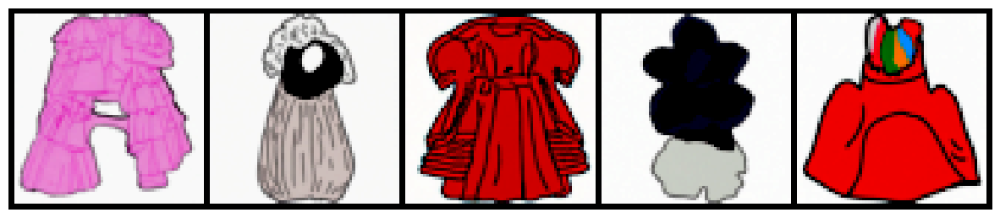

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


cfg: {'ADA_INTEG_STEPS': 100, 'BATCH_SIZE': 5, 'DATA_DIR': '/kaggle/input/avantgarde-highres/super_res_avantgarde', 'DISCRIM_AUG': True, 'EPOCHS': 12000, 'IMAGE_SIZE': 64, 'IMG_CHANNELS': 3, 'LOSS': 'bce', 'LR': 0.0002, 'REPEATS': 1, 'SAVE_FREQ': 10, 'SEED': 42, 'SMOOTH': 0.1, 'TOT_UNIQUE_IMG': 27, 'USE_WANDB': True, 'WANDB_ENTITY': 'elles', 'WANDB_EXP_NAME': 'verticalflip', 'WANDB_PROJECT': 'avantGAN', 'WEIGHT_DECAY': None, 'Z_DIM': 100}
wandb init


Epochs:   0%|          | 0/12000 [00:00<?, ?it/s]

Epoch [1/12000], Step [1/6], D Loss: 1.4915, G Loss: 3.1232, Real Accuracy: 1.0000, Fake Accuracy: 0.2000
Epoch [1/12000], Step [2/6], D Loss: 0.9873, G Loss: 3.1468, Real Accuracy: 1.0000, Fake Accuracy: 0.8000
Epoch [1/12000], Step [3/6], D Loss: 1.1373, G Loss: 2.4676, Real Accuracy: 1.0000, Fake Accuracy: 0.6000
Epoch [1/12000], Step [4/6], D Loss: 0.8690, G Loss: 3.8638, Real Accuracy: 0.8000, Fake Accuracy: 1.0000
Epoch [1/12000], Step [5/6], D Loss: 1.3727, G Loss: 4.6667, Real Accuracy: 1.0000, Fake Accuracy: 0.2000


Epochs:   0%|          | 1/12000 [00:03<12:30:57,  3.76s/it]

Epoch [1/12000], Step [6/6], D Loss: 0.8056, G Loss: 4.7862, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   2%|▏         | 200/12000 [00:48<41:45,  4.71it/s]  

Epoch [201/12000], Step [1/6], D Loss: 0.7445, G Loss: 0.3423, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [201/12000], Step [2/6], D Loss: 0.6747, G Loss: 0.3311, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [201/12000], Step [3/6], D Loss: 0.6782, G Loss: 0.3335, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [201/12000], Step [4/6], D Loss: 0.6920, G Loss: 0.4320, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [201/12000], Step [5/6], D Loss: 0.8083, G Loss: 0.3477, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   2%|▏         | 201/12000 [00:48<1:04:39,  3.04it/s]

Epoch [201/12000], Step [6/6], D Loss: 0.6922, G Loss: 0.3471, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   3%|▎         | 400/12000 [01:32<36:35,  5.28it/s]  

Epoch [401/12000], Step [1/6], D Loss: 0.7847, G Loss: 0.3682, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [401/12000], Step [2/6], D Loss: 0.6993, G Loss: 0.7716, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [401/12000], Step [3/6], D Loss: 0.7483, G Loss: 0.4648, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [401/12000], Step [4/6], D Loss: 0.8197, G Loss: 0.3841, Real Accuracy: 0.8000, Fake Accuracy: 1.0000
Epoch [401/12000], Step [5/6], D Loss: 0.6995, G Loss: 0.4437, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [401/12000], Step [6/6], D Loss: 0.7467, G Loss: 0.7383, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   5%|▌         | 600/12000 [02:17<32:28,  5.85it/s]  

Epoch [601/12000], Step [1/6], D Loss: 1.1114, G Loss: 0.5929, Real Accuracy: 1.0000, Fake Accuracy: 0.6000
Epoch [601/12000], Step [2/6], D Loss: 0.7279, G Loss: 0.9707, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [601/12000], Step [3/6], D Loss: 1.1870, G Loss: 0.3729, Real Accuracy: 0.4000, Fake Accuracy: 1.0000
Epoch [601/12000], Step [4/6], D Loss: 0.7075, G Loss: 0.5163, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   5%|▌         | 601/12000 [02:18<58:05,  3.27it/s]

Epoch [601/12000], Step [5/6], D Loss: 0.7598, G Loss: 0.6358, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [601/12000], Step [6/6], D Loss: 0.6806, G Loss: 0.4863, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   7%|▋         | 800/12000 [03:03<32:18,  5.78it/s]  

Epoch [801/12000], Step [1/6], D Loss: 0.6618, G Loss: 0.3462, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [801/12000], Step [2/6], D Loss: 0.6867, G Loss: 0.3373, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [801/12000], Step [3/6], D Loss: 0.7755, G Loss: 0.3299, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [801/12000], Step [4/6], D Loss: 0.6884, G Loss: 0.3419, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [801/12000], Step [5/6], D Loss: 0.7433, G Loss: 0.3387, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [801/12000], Step [6/6], D Loss: 0.7453, G Loss: 0.3600, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   8%|▊         | 1000/12000 [03:48<37:17,  4.92it/s] 

Epoch [1001/12000], Step [1/6], D Loss: 1.0326, G Loss: 0.4100, Real Accuracy: 0.6000, Fake Accuracy: 1.0000
Epoch [1001/12000], Step [2/6], D Loss: 0.6748, G Loss: 0.3395, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1001/12000], Step [3/6], D Loss: 0.6547, G Loss: 0.3810, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1001/12000], Step [4/6], D Loss: 0.7798, G Loss: 0.6356, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1001/12000], Step [5/6], D Loss: 0.6926, G Loss: 0.5513, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:   8%|▊         | 1001/12000 [03:48<59:22,  3.09it/s]

Epoch [1001/12000], Step [6/6], D Loss: 1.0366, G Loss: 0.3795, Real Accuracy: 0.5000, Fake Accuracy: 1.0000


Epochs:  10%|█         | 1200/12000 [04:33<31:46,  5.66it/s]  

Epoch [1201/12000], Step [1/6], D Loss: 0.7048, G Loss: 0.3773, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1201/12000], Step [2/6], D Loss: 0.7058, G Loss: 0.3984, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1201/12000], Step [3/6], D Loss: 0.8415, G Loss: 0.4053, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1201/12000], Step [4/6], D Loss: 0.8422, G Loss: 0.3284, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  10%|█         | 1201/12000 [04:34<55:23,  3.25it/s]

Epoch [1201/12000], Step [5/6], D Loss: 1.0789, G Loss: 0.6129, Real Accuracy: 1.0000, Fake Accuracy: 0.6000
Epoch [1201/12000], Step [6/6], D Loss: 0.7147, G Loss: 0.9207, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  12%|█▏        | 1400/12000 [05:19<33:00,  5.35it/s]  

Epoch [1401/12000], Step [1/6], D Loss: 1.3571, G Loss: 2.5322, Real Accuracy: 0.0000, Fake Accuracy: 1.0000
Epoch [1401/12000], Step [2/6], D Loss: 0.7712, G Loss: 1.5411, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1401/12000], Step [3/6], D Loss: 0.7965, G Loss: 0.9161, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1401/12000], Step [4/6], D Loss: 0.7505, G Loss: 0.5482, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1401/12000], Step [5/6], D Loss: 0.7642, G Loss: 0.4451, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1401/12000], Step [6/6], D Loss: 0.7718, G Loss: 0.5430, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  13%|█▎        | 1600/12000 [06:04<32:15,  5.37it/s]  

Epoch [1601/12000], Step [1/6], D Loss: 0.7689, G Loss: 0.4334, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1601/12000], Step [2/6], D Loss: 0.6895, G Loss: 0.4696, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1601/12000], Step [3/6], D Loss: 0.6866, G Loss: 0.7116, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1601/12000], Step [4/6], D Loss: 0.6938, G Loss: 0.5812, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1601/12000], Step [5/6], D Loss: 0.7247, G Loss: 0.3574, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1601/12000], Step [6/6], D Loss: 0.8756, G Loss: 0.5003, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  15%|█▌        | 1800/12000 [06:49<30:51,  5.51it/s]  

Epoch [1801/12000], Step [1/6], D Loss: 0.8375, G Loss: 0.4152, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1801/12000], Step [2/6], D Loss: 0.6581, G Loss: 0.3413, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1801/12000], Step [3/6], D Loss: 0.7492, G Loss: 0.3570, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1801/12000], Step [4/6], D Loss: 0.6668, G Loss: 0.3722, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1801/12000], Step [5/6], D Loss: 0.6923, G Loss: 0.3353, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [1801/12000], Step [6/6], D Loss: 0.6525, G Loss: 0.3316, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  17%|█▋        | 2000/12000 [07:34<35:12,  4.73it/s]  

Epoch [2001/12000], Step [1/6], D Loss: 0.6609, G Loss: 0.3390, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2001/12000], Step [2/6], D Loss: 0.6612, G Loss: 0.3333, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2001/12000], Step [3/6], D Loss: 0.6602, G Loss: 0.3363, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2001/12000], Step [4/6], D Loss: 0.6592, G Loss: 0.3296, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2001/12000], Step [5/6], D Loss: 0.6793, G Loss: 0.3334, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  17%|█▋        | 2001/12000 [07:34<54:58,  3.03it/s]

Epoch [2001/12000], Step [6/6], D Loss: 0.6790, G Loss: 0.3341, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  18%|█▊        | 2110/12000 [07:59<30:43,  5.37it/s]  wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:01.269653, resuming normal operation.
Epochs:  18%|█▊        | 2200/12000 [08:19<29:30,  5.53it/s]

Epoch [2201/12000], Step [1/6], D Loss: 0.7056, G Loss: 0.5452, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2201/12000], Step [2/6], D Loss: 0.6672, G Loss: 0.7139, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2201/12000], Step [3/6], D Loss: 0.6936, G Loss: 0.5247, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2201/12000], Step [4/6], D Loss: 0.6798, G Loss: 0.7082, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2201/12000], Step [5/6], D Loss: 0.6710, G Loss: 0.5317, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  18%|█▊        | 2201/12000 [08:20<50:26,  3.24it/s]

Epoch [2201/12000], Step [6/6], D Loss: 0.7674, G Loss: 0.8683, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  20%|█▉        | 2375/12000 [08:59<32:51,  4.88it/s]  wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:07.373470, resuming normal operation.
Epochs:  20%|██        | 2400/12000 [09:05<27:16,  5.87it/s]

Epoch [2401/12000], Step [1/6], D Loss: 0.9531, G Loss: 0.5629, Real Accuracy: 1.0000, Fake Accuracy: 0.6000
Epoch [2401/12000], Step [2/6], D Loss: 0.7191, G Loss: 0.6840, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2401/12000], Step [3/6], D Loss: 0.6911, G Loss: 0.6074, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2401/12000], Step [4/6], D Loss: 0.6836, G Loss: 0.5948, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2401/12000], Step [5/6], D Loss: 0.6597, G Loss: 0.6394, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2401/12000], Step [6/6], D Loss: 0.6589, G Loss: 0.6743, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  22%|██▏       | 2600/12000 [09:50<28:56,  5.41it/s]  

Epoch [2601/12000], Step [1/6], D Loss: 0.6869, G Loss: 0.4653, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2601/12000], Step [2/6], D Loss: 0.6657, G Loss: 0.4747, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2601/12000], Step [3/6], D Loss: 0.6714, G Loss: 0.5961, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2601/12000], Step [4/6], D Loss: 0.6598, G Loss: 0.4998, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2601/12000], Step [5/6], D Loss: 0.6810, G Loss: 0.5798, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2601/12000], Step [6/6], D Loss: 0.8967, G Loss: 0.7534, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  23%|██▎       | 2800/12000 [10:35<27:41,  5.54it/s]

Epoch [2801/12000], Step [1/6], D Loss: 0.6784, G Loss: 0.3531, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2801/12000], Step [2/6], D Loss: 0.8817, G Loss: 1.4792, Real Accuracy: 1.0000, Fake Accuracy: 0.8000
Epoch [2801/12000], Step [3/6], D Loss: 0.9387, G Loss: 0.7374, Real Accuracy: 0.6000, Fake Accuracy: 1.0000
Epoch [2801/12000], Step [4/6], D Loss: 0.6654, G Loss: 0.8209, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [2801/12000], Step [5/6], D Loss: 0.6603, G Loss: 0.6682, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  23%|██▎       | 2801/12000 [10:36<46:38,  3.29it/s]

Epoch [2801/12000], Step [6/6], D Loss: 0.7235, G Loss: 0.3839, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  25%|██▍       | 2971/12000 [11:14<56:35,  2.66it/s]wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:03.579558, resuming normal operation.
Epochs:  25%|██▌       | 3000/12000 [11:21<31:17,  4.79it/s]

Epoch [3001/12000], Step [1/6], D Loss: 0.7192, G Loss: 0.4367, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3001/12000], Step [2/6], D Loss: 0.6934, G Loss: 0.3790, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3001/12000], Step [3/6], D Loss: 0.7333, G Loss: 0.4858, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3001/12000], Step [4/6], D Loss: 0.6802, G Loss: 0.4873, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3001/12000], Step [5/6], D Loss: 0.7131, G Loss: 0.6152, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3001/12000], Step [6/6], D Loss: 1.0308, G Loss: 0.5019, Real Accuracy: 0.5000, Fake Accuracy: 1.0000


Epochs:  27%|██▋       | 3200/12000 [12:05<29:01,  5.05it/s]

Epoch [3201/12000], Step [1/6], D Loss: 0.6577, G Loss: 0.4991, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3201/12000], Step [2/6], D Loss: 0.6673, G Loss: 0.4519, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3201/12000], Step [3/6], D Loss: 0.6620, G Loss: 0.4693, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3201/12000], Step [4/6], D Loss: 0.6585, G Loss: 0.4646, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3201/12000], Step [5/6], D Loss: 0.6574, G Loss: 0.5160, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  27%|██▋       | 3201/12000 [12:06<46:49,  3.13it/s]

Epoch [3201/12000], Step [6/6], D Loss: 1.0998, G Loss: 0.7443, Real Accuracy: 1.0000, Fake Accuracy: 0.5000


Epochs:  28%|██▊       | 3400/12000 [12:51<25:37,  5.60it/s]

Epoch [3401/12000], Step [1/6], D Loss: 0.6832, G Loss: 0.4709, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3401/12000], Step [2/6], D Loss: 0.6747, G Loss: 0.4933, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3401/12000], Step [3/6], D Loss: 0.8116, G Loss: 1.0703, Real Accuracy: 1.0000, Fake Accuracy: 0.8000
Epoch [3401/12000], Step [4/6], D Loss: 1.1748, G Loss: 0.4024, Real Accuracy: 0.0000, Fake Accuracy: 1.0000
Epoch [3401/12000], Step [5/6], D Loss: 0.8017, G Loss: 1.5849, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3401/12000], Step [6/6], D Loss: 0.6820, G Loss: 1.4773, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  30%|███       | 3600/12000 [13:36<26:34,  5.27it/s]

Epoch [3601/12000], Step [1/6], D Loss: 0.6653, G Loss: 1.0543, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3601/12000], Step [2/6], D Loss: 0.6710, G Loss: 1.0132, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3601/12000], Step [3/6], D Loss: 0.7795, G Loss: 0.6332, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3601/12000], Step [4/6], D Loss: 0.8192, G Loss: 0.8632, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  30%|███       | 3601/12000 [13:37<44:05,  3.17it/s]

Epoch [3601/12000], Step [5/6], D Loss: 0.7454, G Loss: 1.0183, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3601/12000], Step [6/6], D Loss: 0.6926, G Loss: 0.9677, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  31%|███       | 3700/12000 [13:59<24:31,  5.64it/s]wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:07.332384, resuming normal operation.
Epochs:  32%|███▏      | 3800/12000 [14:22<25:19,  5.40it/s]

Epoch [3801/12000], Step [1/6], D Loss: 0.6710, G Loss: 0.4888, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3801/12000], Step [2/6], D Loss: 0.6618, G Loss: 0.5034, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3801/12000], Step [3/6], D Loss: 0.6658, G Loss: 0.6147, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3801/12000], Step [4/6], D Loss: 0.6599, G Loss: 0.5742, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3801/12000], Step [5/6], D Loss: 0.6572, G Loss: 0.6706, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [3801/12000], Step [6/6], D Loss: 0.6527, G Loss: 0.8077, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  33%|███▎      | 4000/12000 [15:05<25:53,  5.15it/s]

Epoch [4001/12000], Step [1/6], D Loss: 0.6533, G Loss: 0.3346, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4001/12000], Step [2/6], D Loss: 0.6665, G Loss: 0.3338, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4001/12000], Step [3/6], D Loss: 0.6596, G Loss: 0.3305, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4001/12000], Step [4/6], D Loss: 0.6573, G Loss: 0.3303, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4001/12000], Step [5/6], D Loss: 0.6601, G Loss: 0.3436, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4001/12000], Step [6/6], D Loss: 0.6574, G Loss: 0.3332, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  34%|███▍      | 4118/12000 [15:33<25:09,  5.22it/s]wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:07.238617, resuming normal operation.
Epochs:  35%|███▍      | 4175/12000 [15:46<28:17,  4.61it/s]wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
Epochs:  35%|███▌      | 4200/12000 [15:51<24:18,  5.35it/s]

Epoch [4201/12000], Step [1/6], D Loss: 0.6593, G Loss: 0.6523, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4201/12000], Step [2/6], D Loss: 0.6741, G Loss: 0.7705, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4201/12000], Step [3/6], D Loss: 0.6577, G Loss: 0.5660, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4201/12000], Step [4/6], D Loss: 0.6646, G Loss: 0.5930, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4201/12000], Step [5/6], D Loss: 0.6681, G Loss: 0.5390, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4201/12000], Step [6/6], D Loss: 0.8096, G Loss: 0.4384, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  37%|███▋      | 4400/12000 [16:35<23:24,  5.41it/s]

Epoch [4401/12000], Step [1/6], D Loss: 0.7627, G Loss: 0.7811, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4401/12000], Step [2/6], D Loss: 0.6897, G Loss: 0.7045, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4401/12000], Step [3/6], D Loss: 0.6898, G Loss: 0.6113, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4401/12000], Step [4/6], D Loss: 0.7313, G Loss: 0.7995, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4401/12000], Step [5/6], D Loss: 0.6732, G Loss: 0.7579, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  37%|███▋      | 4401/12000 [16:36<39:07,  3.24it/s]

Epoch [4401/12000], Step [6/6], D Loss: 0.7342, G Loss: 0.7848, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  38%|███▊      | 4575/12000 [17:16<27:26,  4.51it/s]wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
wandb: Network error resolved after 0:00:01.195148, resuming normal operation.
wandb: 429 encountered ({"error":"rate limit exceeded"}), retrying request
Epochs:  38%|███▊      | 4600/12000 [17:21<22:04,  5.59it/s]

Epoch [4601/12000], Step [1/6], D Loss: 0.6622, G Loss: 0.4077, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4601/12000], Step [2/6], D Loss: 0.6632, G Loss: 0.4085, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4601/12000], Step [3/6], D Loss: 0.6529, G Loss: 0.3778, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4601/12000], Step [4/6], D Loss: 0.6580, G Loss: 0.3714, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4601/12000], Step [5/6], D Loss: 1.5756, G Loss: 1.2805, Real Accuracy: 1.0000, Fake Accuracy: 0.0000
Epoch [4601/12000], Step [6/6], D Loss: 0.9597, G Loss: 1.2363, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  40%|████      | 4800/12000 [18:06<23:24,  5.12it/s]

Epoch [4801/12000], Step [1/6], D Loss: 0.7547, G Loss: 0.5076, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4801/12000], Step [2/6], D Loss: 0.6643, G Loss: 0.4033, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4801/12000], Step [3/6], D Loss: 0.6570, G Loss: 0.5332, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4801/12000], Step [4/6], D Loss: 0.6600, G Loss: 0.4691, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [4801/12000], Step [5/6], D Loss: 0.6723, G Loss: 0.3996, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  40%|████      | 4801/12000 [18:07<38:11,  3.14it/s]

Epoch [4801/12000], Step [6/6], D Loss: 0.6541, G Loss: 0.4133, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  42%|████▏     | 5000/12000 [18:50<28:38,  4.07it/s]

Epoch [5001/12000], Step [1/6], D Loss: 0.6657, G Loss: 0.4252, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5001/12000], Step [2/6], D Loss: 0.6836, G Loss: 0.4701, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5001/12000], Step [3/6], D Loss: 0.6761, G Loss: 0.5975, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5001/12000], Step [4/6], D Loss: 0.6902, G Loss: 0.5764, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5001/12000], Step [5/6], D Loss: 0.6599, G Loss: 0.6468, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5001/12000], Step [6/6], D Loss: 0.6614, G Loss: 0.6898, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  43%|████▎     | 5200/12000 [19:36<18:56,  5.98it/s]

Epoch [5201/12000], Step [1/6], D Loss: 0.6902, G Loss: 1.8701, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5201/12000], Step [2/6], D Loss: 0.7241, G Loss: 1.8178, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5201/12000], Step [3/6], D Loss: 0.7006, G Loss: 1.6834, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5201/12000], Step [4/6], D Loss: 0.7039, G Loss: 1.3028, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5201/12000], Step [5/6], D Loss: 0.7065, G Loss: 1.4305, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5201/12000], Step [6/6], D Loss: 0.6750, G Loss: 1.2133, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  45%|████▌     | 5400/12000 [20:21<20:35,  5.34it/s]

Epoch [5401/12000], Step [1/6], D Loss: 0.6670, G Loss: 0.7089, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5401/12000], Step [2/6], D Loss: 0.6669, G Loss: 0.8588, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5401/12000], Step [3/6], D Loss: 0.7004, G Loss: 0.8336, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5401/12000], Step [4/6], D Loss: 0.6700, G Loss: 0.7604, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5401/12000], Step [5/6], D Loss: 0.6678, G Loss: 0.9357, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5401/12000], Step [6/6], D Loss: 0.6625, G Loss: 0.9099, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  47%|████▋     | 5600/12000 [21:05<19:41,  5.42it/s]

Epoch [5601/12000], Step [1/6], D Loss: 0.6788, G Loss: 0.7006, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5601/12000], Step [2/6], D Loss: 0.8409, G Loss: 1.0002, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5601/12000], Step [3/6], D Loss: 0.6571, G Loss: 0.9926, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5601/12000], Step [4/6], D Loss: 0.6636, G Loss: 0.9469, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5601/12000], Step [5/6], D Loss: 0.6574, G Loss: 1.3724, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5601/12000], Step [6/6], D Loss: 0.6574, G Loss: 0.6939, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  48%|████▊     | 5800/12000 [21:52<19:39,  5.26it/s]

Epoch [5801/12000], Step [1/6], D Loss: 0.6643, G Loss: 0.3655, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5801/12000], Step [2/6], D Loss: 0.6586, G Loss: 0.4017, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5801/12000], Step [3/6], D Loss: 0.6588, G Loss: 0.3715, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5801/12000], Step [4/6], D Loss: 0.6631, G Loss: 0.4433, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  48%|████▊     | 5801/12000 [21:53<32:48,  3.15it/s]

Epoch [5801/12000], Step [5/6], D Loss: 0.6765, G Loss: 0.4678, Real Accuracy: 1.0000, Fake Accuracy: 1.0000
Epoch [5801/12000], Step [6/6], D Loss: 0.6562, G Loss: 0.4121, Real Accuracy: 1.0000, Fake Accuracy: 1.0000


Epochs:  48%|████▊     | 5809/12000 [21:54<23:21,  4.42it/s]


Training interrupted


D FakeLoss,▂▁█▂▁▁█▁▂▂▁▂▁▆▃▁▃▂▁▁▄▁▁▂▁▁▁▁▁▁▂▃▁▁▁▂▁▁▁▁
D RealLoss,▁▁▂▂▁▂█▁▁▃▁▁▁▁▁▁▁▁▁▂█▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁
Epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
Fake Accuracy,██▁█████████████████████████████████████
G Loss,▁▂▃▁▂▁▃▁▃▂▁▃▁▁▂▁▂▁▁▁█▅▁▁▂▁▂▃▂▃▄▃▂▂▂▃▃▁▂▁
Real Accuracy,██████▂██▅██████████▁███████████████████
Step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
aug_probs,██████▁█████████████▁███████████████████
D FakeLoss,0.33227
D RealLoss,0.32651
Epoch,5810


In [14]:
# Run the training loop
class Config:
    SEED = 42
    N_GPU = 1

    USE_WANDB = True
    WANDB_PROJECT = 'avantGAN'
    WANDB_ENTITY = 'elles'

    EPOCHS = 12000
    TOT_UNIQUE_IMG = 27
    LOSS = 'bce'
    BATCH_SIZE = 5
    IMAGE_SIZE = 64
    IMG_CHANNELS = 3
    Z_DIM = 100
    SMOOTH = 0.1
    REPEATS = 1 # num times to duplicate images
    SAVE_FREQ = 10 # epochs
    LOG_FREQ = 200 # epochs
    DISCRIM_AUG = True
    ADA_INTEG_STEPS = 100

    WANDB_EXP_NAME = 'final'
    DATA_DIR = '/kaggle/input/avantgarde-highres/super_res_avantgarde'
    
    LR = 0.0002
    WEIGHT_DECAY = None
    N_GEN_FEATS = 64
    N_DISC_FEATS = 64
    
    @classmethod
    def to_dict(cls):
        config_dict = {attr: getattr(cls, attr) for attr in dir(cls) if not callable(getattr(cls, attr)) and not attr.startswith("__")}
        return config_dict

cfg = Config()
set_seed(cfg.SEED)

data_manager = DataManager(cfg.DATA_DIR, cfg.BATCH_SIZE, cfg.IMAGE_SIZE, cfg.Z_DIM, cfg.REPEATS)

# Preview images
preview_images(data_manager.get_dataloader())

generator = Generator(cfg.N_GEN_FEATS, cfg.N_GPU, cfg.Z_DIM, cfg.IMG_CHANNELS).to(device)
generator.apply(weights_init)
discriminator = Discriminator(cfg.N_DISC_FEATS, cfg.N_GPU, cfg.IMG_CHANNELS).to(device)
discriminator.apply(weights_init)

g_optimizer = optim.AdamW(generator.parameters(), lr=cfg.LR, betas=(0.5, 0.999))
d_optimizer = optim.AdamW(discriminator.parameters(), lr=cfg.LR, betas=(0.5, 0.999))

print(f"cfg: {cfg.to_dict()}")

if cfg.LOSS == 'bce_logits':
    criterion = nn.BCEWithLogitsLoss()
elif cfg.LOSS == 'bce':
    criterion = nn.BCELoss()
elif cfg.LOSS == 'ce':
    criterion = nn.CrossEntropyLoss()
else:
    raise ValueError('Invalid loss function specified')

if cfg.USE_WANDB:
    wandb.login()
    wandb_id = wandb.util.generate_id()
    print("wandb init")
    wandb.init(
        project=cfg.WANDB_PROJECT,
        name=f"{cfg.WANDB_EXP_NAME}_{cfg.LR}_ep{cfg.EPOCHS}",
        entity=cfg.WANDB_ENTITY,
        config=cfg.to_dict(),
        id=wandb_id,
        resume="allow",
    )
    wandb.watch(generator, log="all")
    wandb.watch(discriminator, log="all")
try:
    train_gan(data_manager, generator, discriminator, g_optimizer, d_optimizer, criterion, cfg.EPOCHS, device, cfg=cfg)
except KeyboardInterrupt:
    print('Training interrupted')
finally:
    if cfg.USE_WANDB:
        wandb.finish()

## Inference

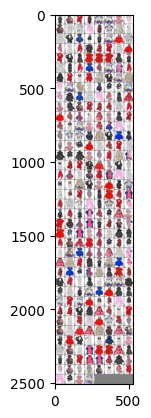

In [32]:
with torch.no_grad():
    n_images = 300
    z = torch.randn(n_images, cfg.Z_DIM, 1, 1, device=device)
#         print(f"shape {fixed_size_subset.shape}")
    fake_images = generator(z.to(device)).cpu()
#         print(f"raw fake im shape {fake_images.shape}")
    # TODO: is this correct?
    fake_images = fake_images.view(fake_images.size(0), 3, cfg.IMAGE_SIZE, cfg.IMAGE_SIZE)
    imshow(vutils.make_grid(fake_images))

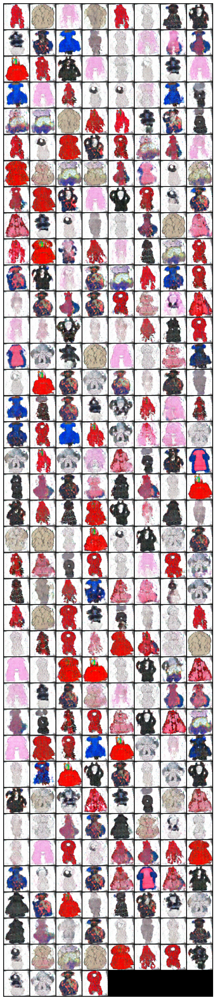

In [29]:
grid = vutils.make_grid(fake_images, nrow=8, normalize=True)

# Plot the grid with a larger figure size
plt.figure(figsize=(40, 40))  # Change the figure size as needed
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.axis('off')  # Turn off axis labels
plt.show()

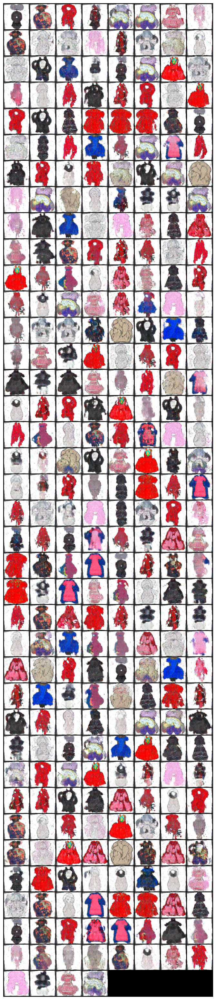

In [33]:
grid = vutils.make_grid(fake_images, nrow=8, normalize=True)

# Plot the grid with a larger figure size
plt.figure(figsize=(40, 40))  # Change the figure size as needed
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.axis('off')  # Turn off axis labels
plt.show()

In [31]:
torch.save(generator.state_dict(), "gen_diverse27_36kepoch.pt")

Total images with 1 duplicates: 27


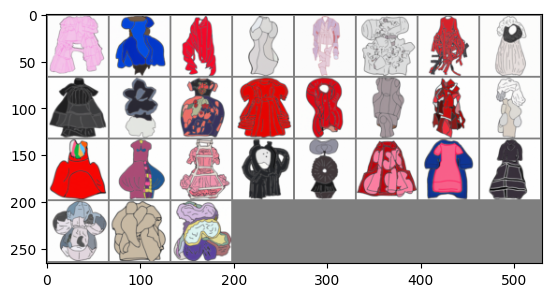

In [8]:
data_manager = DataManager(cfg.DATA_DIR, 27, cfg.IMAGE_SIZE, cfg.Z_DIM, cfg.REPEATS)
dataloader = data_manager.get_dataloader()

# Preview images
preview_images(dataloader)

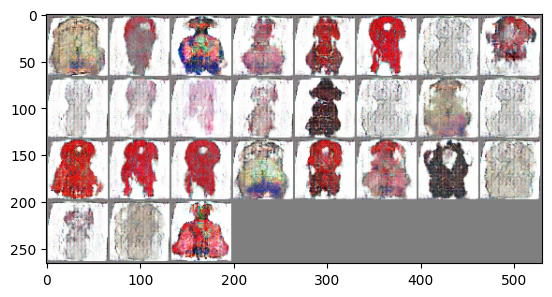

In [9]:
imshow(vutils.make_grid(fake_images))